**Assignment:** A04 — Entropy and Cross Entropy<br>

**Project Topic:** Entropy and Cross Entropy<BR>

**Date:** September 25, 2026

**Instructor:** V. Rao

---

## Team 3 Roster:
>---
Cherluk
>---
Michael
>---
Olu
>---
Taki
>---
>---
## Our Collaborative Objectives

- Define entropy and explain its role in measuring uncertainty.
- Define cross-entropy and distinguish it from entropy.
- Explain how cross-entropy is used as a machine-learning loss function.
- Demonstrate entropy and cross-entropy calculations using example probability distributions.
- Interpret the meaning of low and high cross-entropy values during model training.



# What is Entropy?
Think of entropy as a way to measure how unpredictable something is, like trying to guess what color marble you will pull from a very mixed up bag. Cross entropy is a way to measure how far off your guess is from what is actually in the bag.   When people teach computers to recognize things, like telling the difference between a picture of a cat and a dog, they use cross entropy to grade the computer. If the computer makes a bad guess and is very confident about the wrong answer, cross entropy gives it a heavy penalty. This bad score forces the computer to learn from its mistakes and do a better job next time. You can see these concepts explained below.

---



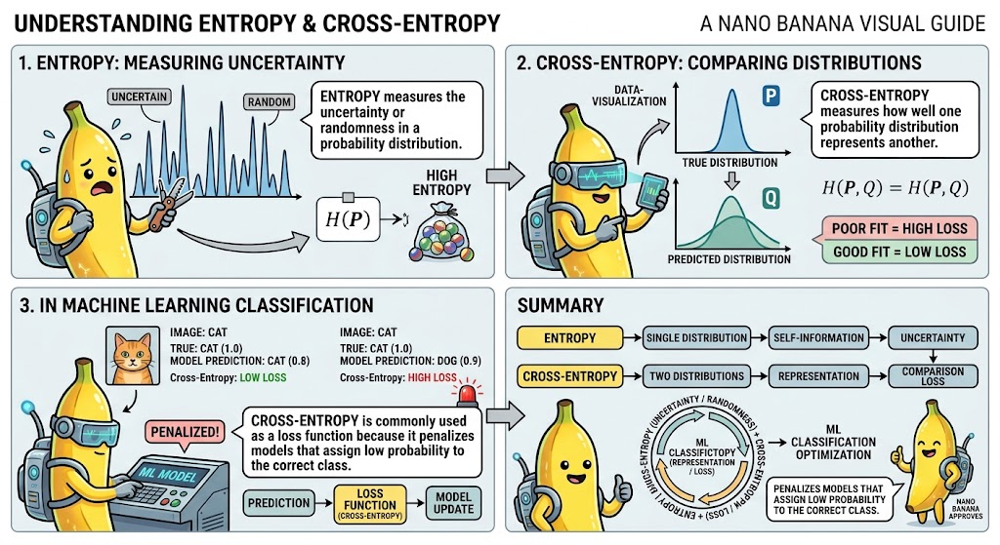


---

---
### The Team's Challenge

Expressing the concepts through a narrative that targets a learning group defined as an "11-year Old"

---

## Tools equipped with

___

| Entropy |

---
a measure of uncertainty in a random variable or probability distribution.

For a discrete probability distribution, entropy is calculated as:
```
\[
H(P) = -\sum_{i=1}^{n} p_i \log_2(p_i)
\]
```
Where:

- \(H(P)\) is the entropy of distribution \(P\)
- \(p_i\) is the probability of outcome \(i\)
- \(\log_2\) expresses the result in bits

A distribution has high entropy when outcomes are relatively unpredictable. A distribution has low entropy when one outcome is much more likely than the others.
___

|Cross-Entropy|

---

Cross-entropy measures the difference between a true probability distribution and a predicted probability distribution.
```
\[
H(P, Q) = -\sum_{i=1}^{n} p_i \log(q_i)
\]
```
Where:

- \(P\) represents the true probability distribution
- \(Q\) represents the predicted probability distribution
- \(p_i\) is the actual probability for class \(i\)
- \(q_i\) is the predicted probability for class \(i\)

---

| Code |

---
Assembled in Python, the code below demonstrates how a user can apply mathematical formulas to calculate entropy and cross-entropy within a model. It allows the user to define and experiment with their own formulas while observing how these measures can be used to evaluate uncertainty and prediction error.

```python
import numpy as np

def cross_entropy(true_distribution, predicted_distribution):
    predicted_distribution = np.clip(
        predicted_distribution,
        1e-15,
        1 - 1e-15
    )

    return -np.sum(
        true_distribution * np.log(predicted_distribution)
    )

true_label = np.array([0, 1, 0])

good_prediction = np.array([0.10, 0.80, 0.10])
bad_prediction = np.array([0.70, 0.10, 0.20])

good_loss = cross_entropy(true_label, good_prediction)
bad_loss = cross_entropy(true_label, bad_prediction)

print(f"Cross-entropy for good prediction: {good_loss:.4f}")
print(f"Cross-entropy for bad prediction: {bad_loss:.4f}")
```
Results:
~~~
Cross-entropy for good prediction: 0.2231
Cross-entropy for bad prediction: 2.3026
~~~
---

#Under A Microscope: Translating the Code

      1. The True Distribution Filter
($P$)
In the code snippet, true_label = np.array([0, 1, 0]) acts as our $P$. This array structure is known as one-hot encoding. Because the true class has a value of $1$ and all other classes are $0$, the multiplication step ($P(i) \times \log(Q(i))$) effectively neutralizes the irrelevant guesses. The summation collapses, isolating the calculation to evaluate only the model's prediction for the actual correct answer.</BR>
    
     2. The Logarithmic Penalty        
($\log(Q)$)
The formula uses np.log to generate an asymmetric penalty. If the model perfectly predicts the correct class with a probability of $1.0$, the $\log(1.0)$ evaluates to $0$, resulting in zero loss. However, as the predicted probability drops toward $0$, the logarithmic function accelerates sharply toward negative infinity. This mathematical curve is what creates a severe penalty when the model assigns a low probability to the correct class.   
   
     3. The Numerical Stability Guardrail
[(np.clip)]
The most opaque line in the code—clipping the predictions to 1e-15—is a programmatic necessity, not a theoretical feature. Because the logarithm of absolute zero is mathematically undefined, a prediction of exactly 0.0 would cause the system to crash with an error. The np.clip function establishes an infinitesimal floor, keeping the software running smoothly without altering the conceptual intent of the cross-entropy measurement.


## Importance in Deep Learning

Cross-entropy is widely used in deep-learning models for:

- Image classification
- Spam-email detection
- Sentiment analysis
- Medical diagnosis classification
- Object recognition
- Speech recognition
- Natural-language processing
- Neural-network training

During training, an optimizer such as gradient descent adjusts model weights to reduce cross-entropy loss. As the loss decreases, the model’s predicted probability distribution becomes closer to the true distribution.

---

## Conclusion

Entropy provides a way to quantify uncertainty in a probability distribution. Cross-entropy extends this idea by comparing a model’s predicted probabilities with the actual expected probabilities.

In machine learning, minimizing cross-entropy helps classification models learn to assign high probability to the correct class and low probability to incorrect classes. For this reason, cross-entropy is one of the most important loss functions used in neural networks and modern artificial-intelligence applications.

---

In classification models, the true label is often represented using **one-hot encoding**. The model output is usually a probability distribution generated by a softmax activation function.

---

## Entropy vs. Cross-Entropy

| Feature | Entropy | Cross-Entropy |
|---|---|---|
| Measures | Uncertainty within one distribution | Difference between actual and predicted distributions |
| Distributions used | One probability distribution | Two probability distributions |
| Typical use | Information theory and uncertainty measurement | Classification loss function in machine learning |
| Goal | Describe unpredictability | Evaluate prediction quality |
| Lower value means | More certain distribution | More accurate model prediction |

---

## Example

Assume a classification problem with three possible classes:

- Cat
- Dog
- Bird

The true label is **Dog**:

```text
True distribution (P):[0][1]
```

A model predicts:

```text
Predicted distribution (Q): [0.10, 0.80, 0.10]
```

Because the model assigned a high probability of `0.80` to the correct class, the cross-entropy loss will be relatively low.

If the model instead predicts:

```text
Predicted distribution (Q): [0.70, 0.10, 0.20]
```

The model assigned only `0.10` probability to the correct class. This produces a much higher cross-entropy loss because the prediction is confidently incorrect.

In [ ]:
!sudo apt-get update -qq
!sudo apt-get install -y -qq libcairo2-dev libpango1.0-dev ffmpeg
!pip install -q manim

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu noble InRelease' does not seem to provide it (sources.list entry misspelt?)


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Circle, Ellipse, Rectangle, FancyBboxPatch
from IPython.display import HTML, display

# ============================================================
# WHITE ELEPHANT: A SIMPLE PREDICTION STORY
# Paste this entire cell into Google Colab and run it.
# ============================================================

FPS = 12
SECONDS_PER_SCENE = 3
FRAMES_PER_SCENE = FPS * SECONDS_PER_SCENE

BG = "#10182B"
PANEL = "#1D2B45"
WHITE = "#F7F8FC"
MUTED = "#B9C6DB"
YELLOW = "#FFD46B"
GREEN = "#79DBAD"
PINK = "#FF8EAB"
BLUE = "#79B8FF"

scenes = [
    {
        "title": "1. A mystery",
        "message": "Three gifts are wrapped. We don't know what's inside.",
        "note": "Uncertainty means there are answers we don't know yet.",
        "gifts_open": [],
        "owner": None,
        "prediction": None,
        "show_steal": False,
        "result": None,
    },
    {
        "title": "2. A gift is opened",
        "message": "Casey opens Gift A: a robot kit!",
        "note": "Now we know what's inside one gift.",
        "gifts_open": ["A"],
        "owner": "Casey",
        "prediction": None,
        "show_steal": False,
        "result": None,
    },
    {
        "title": "3. Alex makes a guess",
        "message": "Alex predicts Bri will open a new gift.",
        "note": "Alex's guess: OPEN",
        "gifts_open": ["A"],
        "owner": "Casey",
        "prediction": "OPEN",
        "show_steal": False,
        "result": None,
    },
    {
        "title": "4. Surprise!",
        "message": "Bri steals the robot kit from Casey instead.",
        "note": "What actually happened: STEAL",
        "gifts_open": ["A"],
        "owner": "Bri",
        "prediction": "OPEN",
        "show_steal": True,
        "result": None,
    },
    {
        "title": "5. Check the prediction",
        "message": "Alex guessed OPEN. The answer was STEAL.",
        "note": "The prediction was wrong. Alex can learn from that mistake.",
        "gifts_open": ["A"],
        "owner": "Bri",
        "prediction": "OPEN",
        "show_steal": False,
        "result": "WRONG",
    },
]

fig, ax = plt.subplots(figsize=(13, 7.3))
fig.patch.set_facecolor(BG)


def box(x, y, w, h, color=PANEL, edge=None, radius=0.18, lw=1.5):
    patch = FancyBboxPatch(
        (x, y), w, h,
        boxstyle=f"round,pad=0.02,rounding_size={radius}",
        facecolor=color,
        edgecolor=edge or color,
        linewidth=lw,
    )
    ax.add_patch(patch)


def text(x, y, value, size=12, color=WHITE, weight="normal",
         ha="center", va="center"):
    ax.text(
        x, y, value,
        fontsize=size,
        color=color,
        weight=weight,
        ha=ha,
        va=va,
        family="DejaVu Sans",
    )


def person(x, y, name, shirt, active=False):
    edge = YELLOW if active else "#4D6484"

    box(x - 1.12, y - 1.02, 2.24, 2.45, edge=edge, lw=2.3 if active else 1.2)

    ax.add_patch(Ellipse(
        (x, y - 0.22), 0.92, 0.86,
        facecolor=shirt, edgecolor="none"
    ))
    ax.add_patch(Circle(
        (x, y + 0.57), 0.40,
        facecolor="#D79A74", edgecolor="none"
    ))
    ax.add_patch(Ellipse(
        (x, y + 0.86), 0.82, 0.25,
        facecolor="#263149", edgecolor="none"
    ))

    for dx in (-0.13, 0.13):
        ax.add_patch(Circle(
            (x + dx, y + 0.58), 0.025,
            facecolor="#162035"
        ))

    text(x, y - 0.86, name, 12, WHITE, "bold")


def wrapped_gift(x, y, letter):
    box(x - 0.35, y - 0.35, 0.70, 0.70, "#E69C68", WHITE, 0.05, 1.0)
    ax.add_patch(Rectangle(
        (x - 0.055, y - 0.35), 0.11, 0.70,
        facecolor=WHITE, edgecolor="none"
    ))
    ax.add_patch(Rectangle(
        (x - 0.35, y + 0.04), 0.70, 0.10,
        facecolor=WHITE, edgecolor="none"
    ))
    text(x, y - 0.08, letter, 8, BG, "bold")


def draw_scene(scene, progress):
    ax.clear()
    ax.set_facecolor(BG)
    ax.set_xlim(-7.4, 7.4)
    ax.set_ylim(-4.1, 4.1)
    ax.set_aspect("equal")
    ax.axis("off")

    text(0, 3.62, "WHITE ELEPHANT: CAN ALEX PREDICT THE NEXT MOVE?",
         18, WHITE, "bold")
    text(0, 3.12, scene["title"], 13, YELLOW, "bold")

    person(-4.8, 0.55, "Alex", BLUE, active=scene["prediction"] is not None)
    person(0, 0.55, "Casey", GREEN, active=scene["owner"] == "Casey")
    person(4.8, 0.55, "Bri", PINK, active=scene["owner"] == "Bri")

    # Prediction panel under Alex.
    if scene["prediction"]:
        box(-6.1, -1.38, 2.6, 0.65, "#263C5D", BLUE)
        text(-4.8, -1.05, "ALEX GUESSES: OPEN", 9, WHITE, "bold")

    # Ownership label.
    if scene["owner"]:
        owner_x = 0 if scene["owner"] == "Casey" else 4.8
        box(owner_x - 1.05, -1.38, 2.1, 0.65, "#254B49", GREEN)
        text(owner_x, -1.05, "ROBOT KIT", 10, WHITE, "bold")

    # Gift table.
    box(-1.9, -2.52, 3.8, 0.92, "#263753", "#557194")
    for letter, gift_x in zip(("A", "B", "C"), (-1.1, 0, 1.1)):
        if letter in scene["gifts_open"]:
            text(gift_x, -2.06, "OPEN", 9, GREEN, "bold")
        else:
            wrapped_gift(gift_x, -2.06, letter)

    if scene["show_steal"]:
        # Arrow points from Casey toward Bri: the gift's actual movement.
        ax.annotate(
            "",
            xy=(3.65, 0.15),
            xytext=(1.25, 0.15),
            arrowprops=dict(
                arrowstyle="->",
                color=YELLOW,
                linewidth=4,
                mutation_scale=22,
            ),
        )
        text(2.45, 0.55, "STEAL!", 12, YELLOW, "bold")

    if scene["result"]:
        box(2.94, -1.38, 3.55, 0.65, "#573448", PINK)
        text(4.72, -1.05, "ACTUAL MOVE: STEAL", 9, WHITE, "bold")

    box(-6.65, -3.70, 13.3, 0.95, "#263753", "#4F6989")
    text(0, -3.05, scene["message"], 13, WHITE, "bold")
    text(0, -3.42, scene["note"], 10, MUTED)

    # Simple scene progress indicator.
    scene_number = scenes.index(scene) + 1
    text(6.6, 3.55, f"{scene_number}/{len(scenes)}",
         9, MUTED, ha="right")


def update(frame):
    scene_index = min(frame // FRAMES_PER_SCENE, len(scenes) - 1)
    local_frame = frame % FRAMES_PER_SCENE
    progress = local_frame / max(FRAMES_PER_SCENE - 1, 1)

    draw_scene(scenes[scene_index], progress)
    return []


total_frames = len(scenes) * FRAMES_PER_SCENE

animation = FuncAnimation(
    fig,
    update,
    frames=total_frames,
    interval=1000 / FPS,
    blit=False,
    repeat=False,
)

plt.close(fig)
display(HTML(animation.to_jshtml()))

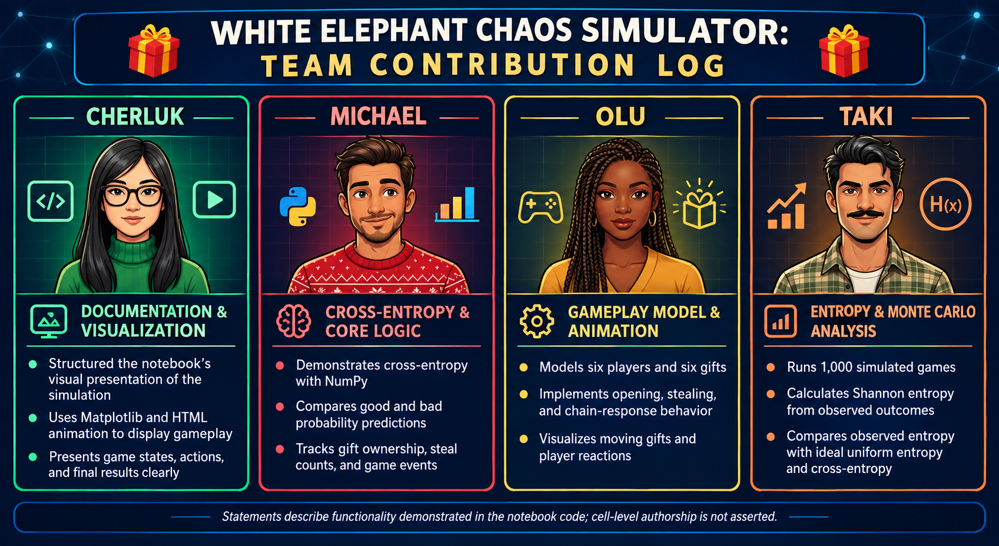
# Team Contribution Log & Reflections

## Cherluk — Documentation & Visualization

**Code and Project Contributions:**
Cherluk contributed to the organization, documentation, and visual presentation of the project. Her work focused on helping turn the technical ideas of entropy and cross-entropy into material that could be followed visually and explained to a younger learner. She also contributed to the presentation structure and documentation of the team's work.

**Why this role:**
Cherluk gravitates toward analytics and finding the key signal within a large amount of detail. While she is still developing some of the team's more advanced programming skills, documentation and visualization gave her a way to contribute directly to how the technical work was communicated. This was especially important because the assignment required the group to explain a difficult machine-learning concept to an audience described as an 11-year-old.

**Translating for an 11-year-old:**
Cherluk focused on avoiding unnecessary technical language and connecting the explanation to something familiar: a Christmas-style gift exchange. Instead of beginning with formulas, the explanation starts with uncertainty, predictions, guesses, and outcomes. The goal was to introduce each idea in a small step before connecting it to the deeper concept of entropy or cross-entropy.

---

## Michael — Core Simulation, Entropy Logic & Technical Integration

**Code and Project Contributions:**
Michael contributed the technical development and integration of the project's entropy and cross-entropy concepts. His work included developing the mathematical logic used to calculate cross-entropy, connecting the probability distributions to the White Elephant example, and working through the visualization and rendering code used to communicate the concepts. He also worked through the technical setup required for the project's animation and video components, including the Manim environment and rendering process.

The notebook demonstrates the cross-entropy calculation using:

```python
true_label = np.array([0, 1, 0])

good_prediction = np.array([0.10, 0.80, 0.10])
bad_prediction = np.array([0.70, 0.10, 0.20])
```

The resulting values show the central idea of the project:

```text
Good prediction: 0.2231
Bad prediction:  2.3026
```

This makes the relationship between the model's confidence and its prediction error visible rather than leaving the concept only as a formula.

**Why this role:**
Michael tends to work through technical problems by testing possibilities, reading error messages, and trying alternative solutions until the underlying problem becomes clear. His interest in entropy also comes partly from his chemistry background. That background provided a useful way to recognize that the word "entropy" appears in different technical contexts while representing related but distinct mathematical ideas. The project provided an opportunity to apply that familiarity to machine learning without treating the two uses of entropy as identical.

**Translating for an 11-year-old:**
The biggest challenge was not writing the calculation but explaining what the calculation means without requiring the audience to understand logarithms or probability theory first. The White Elephant example became the bridge. Instead of beginning with:

> Cross-entropy measures the difference between probability distributions.

the project first asks a simpler question:

> "The computer has three choices, but only one answer is correct."

From there, the audience can see that giving a high probability to the correct answer is better than confidently choosing the wrong answer. The visual storytelling was therefore used to explain the idea before introducing the mathematical details.

---

## Olu — Strategic Thinking & Training Visualization

**Code and Project Contributions:**
Olu contributed to the project's strategic thinking and visualization of the training process. Her work included developing the `ai_game_designer_training.py` Manim material and working with the concepts represented by the training and feedback scenes. She also contributed to the development of the "Disappointment Meter" idea and helped the group think about how repeated predictions and mistakes could be represented visually.

**Why this role:**
Olu came into the project with less hands-on Python experience than some members of the team. Working directly with loops and the visualization code gave her a practical way to build that foundation. Rather than avoiding unfamiliar code, she approached it by trying to understand what each part was doing and how the pieces connected. That approach naturally supported the strategic side of the project.

**Translating for an 11-year-old:**
The "Disappointment Meter" idea developed through several revisions. The group worked through different ways of representing what happens when a prediction does not match the actual result. This helped turn the abstract idea of loss into something easier to visualize. The training process could then be explained as a repeated cycle:

```text
Make a guess
     ↓
See what actually happened
     ↓
Measure the mistake
     ↓
Learn from the mistake
     ↓
Try again
```

This structure helped make the training-loop concept understandable without requiring the audience to begin with neural-network terminology.

---

## Taki — Interactive Gameplay & Entropy Connection

**Code and Project Contributions:**
Taki contributed to the interactive White Elephant concept and helped connect gameplay behavior to the project's entropy discussion. His work focused on developing the character-driven gameplay ideas and exploring how different player behaviors could change the uncertainty of the game.

**Why this role:**
Taki learns most effectively when he has a tangible working example rather than only an abstract explanation. The White Elephant game provided that kind of working environment. Instead of treating entropy only as a mathematical formula, the gameplay gave the team a way to ask what happens when players make different choices and when the next action becomes harder to predict.

**Translating for an 11-year-old:**
The connection between entropy and gameplay was not immediately obvious. The team's earlier work on the prediction and disappointment concepts helped provide the missing bridge. Once the group framed the problem as prediction versus what actually happens, the gameplay became easier to understand:

```text
What do we think will happen?
              ↓
What does the player actually do?
              ↓
Were we confident and correct?
              ↓
How much uncertainty was there?
```

This allowed the game to become an example of the concept rather than requiring the audience to understand the mathematics before seeing why the mathematics matters.

---

# Group Reflection

The team's biggest technical challenge was getting the visualization and video tools to work reliably. Setting up Manim required installing system dependencies, configuring the environment, and working through rendering problems before the animation could be produced. The experience reinforced an important connection to the machine-learning concepts in the project: useful results often come through repeated attempts, errors, adjustments, and new attempts.

That experience also changed how the group thought about the idea of a training loop. A machine-learning model does not simply make a prediction and immediately become correct. It repeatedly produces results, measures error, adjusts, and tries again. The group's own development process followed a similar pattern.

Another important lesson was the value of asking one another questions, including questions that initially seemed obvious. Those conversations exposed differences in how each team member understood the material and revealed where different strengths could be useful. The group learned that dividing work based only on who can write the most code is not necessarily the most effective approach. Documentation, visualization, conceptual explanation, debugging, and experimentation all contributed to the final project.

Most importantly, the group learned that explaining a technical concept to an 11-year-old is not simply a matter of removing difficult vocabulary. The explanation has to be rebuilt around something the audience already understands. In this project, the familiar structure of a gift-exchange game became the foundation for explaining prediction, uncertainty, mistakes, and learning.

---

# References

Shannon, C. E. (1948). *A Mathematical Theory of Communication*. Bell System Technical Journal.

Goodfellow, I., Bengio, Y., & Courville, A. (2016). *Deep Learning*. MIT Press.

TensorFlow. *Classification with Cross-Entropy Loss*.

PyTorch. *CrossEntropyLoss Documentation*.
